In [2]:
!pip install category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 69 kB 3.5 MB/s 


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#method : scaling, log transformation, cube Root normalization, Box-Cox transformation
from scipy.stats import skew 
from scipy.stats import boxcox

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [5]:
df = pd.read_csv('heart_2020_cleaned.csv')
df.shape

(319795, 18)

In [6]:
df = df.drop_duplicates()
df.shape

(301717, 18)

In [7]:
# noise 처리
df = df[(df['BMI'] < 80) & (df['SleepTime'] != 24)]
df.shape

(301653, 18)

In [8]:
def yesno_tolabel(x):
    if (x == 'Yes') | (x == 'Yes (during pregnancy)') :
        return 1
    else:
        return 0

In [9]:
sex_map = {'Female' : 0, 'Male' : 1}
health_map = {'Excellent' : 4, 'Very good' : 3, 'Good' : 2, 'Fair' : 1, 'Poor' : 0}
diabetic_map = {'Yes' : 2, 'Yes (during pregnancy)' : 2, 'No, borderline diabetes' : 1, 'No' : 0}
age_map = {'18-24' : 20, '25-29' : 25, '30-34' : 30, '35-39' : 35, '40-44' : 40, '45-49' : 45, '50-54' : 50, '55-59' : 55, '60-64' : 60, '65-69' : 65, '70-74' : 70, '75-79' : 75, '80 or older' : 80}
columns = ['HeartDisease', 'Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'PhysicalActivity', 'Asthma', 'KidneyDisease', 'SkinCancer']
diabetic_map = {'Yes' : 2, 'Yes (during pregnancy)' : 2, 'No, borderline diabetes' : 1, 'No' : 0}
for column in columns:
    df[column] = df[column].apply(lambda x : yesno_tolabel(x))

df['Sex'] = df['Sex'].map(sex_map)
df['GenHealth'] = df['GenHealth'].map(health_map)
df['Diabetic'] = df['Diabetic'].map(diabetic_map)
df['AgeCategory'] = df['AgeCategory'].map(age_map)

In [10]:
df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,0,55,White,2,1,3,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,0,80,White,0,1,3,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,1,65,White,2,1,1,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,0,75,White,0,0,2,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,0,40,White,0,1,3,8.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,1,27.41,1,0,0,7.0,0.0,1,1,60,Hispanic,2,0,1,6.0,1,0,0
319791,0,29.84,1,0,0,0.0,0.0,0,1,35,Hispanic,0,1,3,5.0,1,0,0
319792,0,24.24,0,0,0,0.0,0.0,0,0,45,Hispanic,0,1,2,6.0,0,0,0
319793,0,32.81,0,0,0,0.0,0.0,0,0,25,Hispanic,0,0,2,12.0,0,0,0


In [11]:
def quantile_operation(outlier_df, column):
    quantile_1 = outlier_df[column].quantile(0.25)
    quantile_3 = outlier_df[column].quantile(0.75)
    iqr = quantile_3 - quantile_1
    Lower_tail = quantile_1 - 1.5 * iqr
    Upper_tail = quantile_3 + 1.5 * iqr

    return Lower_tail, Upper_tail

In [12]:
df['PhysicalHealth'] = df['PhysicalHealth'] + 1
df['MentalHealth'] = df['MentalHealth'] + 1
outlier_columns = ['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
for column in outlier_columns:
    Lower_tail, Upper_tail = quantile_operation(df, column)
    df[column] = boxcox(df[column])[0]

In [13]:
#Race 인코딩 - target encoding
categories = df['Race'].unique()
targets = df['HeartDisease'].unique()
cat_list = []

for cat in categories:
    aux_dict = {}
    aux_dict['category'] = cat
    aux_df = df[df['Race'] == cat]
    counts = aux_df['HeartDisease'].value_counts()
    aux_dict['count'] = sum(counts)
    for t in targets:
        aux_dict['Race_' + str(t)] = counts[t]
    cat_list.append(aux_dict)

cat_list = pd.DataFrame(cat_list)
cat_list['genre_encoded_dumb'] = cat_list['Race_1'] / cat_list['count']

target_dict = {'White' : cat_list['genre_encoded_dumb'][0], 'Black' : cat_list['genre_encoded_dumb'][1], 'Asian' : cat_list['genre_encoded_dumb'][2], 'American Indian/Alaskan Native' : cat_list['genre_encoded_dumb'][3],
               'Other' : cat_list['genre_encoded_dumb'][4], 'Hispanic' : cat_list['genre_encoded_dumb'][5]}
df['Race_encoder'] = df['Race'].map(target_dict)

df.drop(['Race'], axis = 1, inplace = True)

In [14]:
df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,Race_encoder
0,0,1.403407,1,0,0,0.669364,1.089487,0,0,55,2,1,3,3.488639,1,0,1,0.098340
1,0,1.442302,0,0,1,0.000000,0.000000,0,0,80,0,1,3,5.054525,0,0,0,0.098340
2,0,1.487128,1,0,0,0.801003,1.089487,0,1,65,2,1,1,5.813435,1,0,0,0.098340
3,0,1.472250,0,0,0,0.000000,0.000000,0,0,75,0,0,2,4.280563,0,0,1,0.098340
4,0,1.468816,0,0,0,0.807551,0.000000,1,0,40,0,1,3,5.813435,0,0,0,0.098340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,1,1.491857,1,0,0,0.755892,0.000000,1,1,60,2,0,1,4.280563,1,0,0,0.053253
319791,0,1.504497,1,0,0,0.000000,0.000000,0,1,35,0,1,3,3.488639,1,0,0,0.053253
319792,0,1.472452,0,0,0,0.000000,0.000000,0,0,45,0,1,2,4.280563,0,0,0,0.053253
319793,0,1.517915,0,0,0,0.000000,0.000000,0,0,25,0,0,2,8.734516,0,0,0,0.053253


In [15]:
# x y분리
x=df.drop('HeartDisease', axis=1)
x_columns=x.columns
y=df['HeartDisease']

In [16]:
# train test 분리
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size =0.2,random_state = 42)

In [17]:
# 데이터 불균형 처리 전 상태

print('origin target data :\n', df['HeartDisease'].value_counts())

origin target data :
 0    274401
1     27252
Name: HeartDisease, dtype: int64


In [34]:
from sklearn.metrics import *

# 모델링
def modeling(model,x_train,x_test,y_train,y_test):
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    y_pred_proba = model.predict_proba(x_test)[::,1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.figure(figsize=(10,5))
    plt.subplot(1, 2, 1)
    plt.title('ROC curve')
    plt.plot(fpr, tpr)
    plt.xlabel('FPR')
    plt.ylabel('TPR')


    metrics(y_test,pred)

# 평가
def metrics(y_test,pred):
    accuracy = accuracy_score(y_test,pred)
    precision = precision_score(y_test,pred)
    recall = recall_score(y_test,pred)
    f1 = f1_score(y_test,pred)
    matrix = confusion_matrix(y_test, pred)
    roc_score = roc_auc_score(y_test,pred,average='macro')

    print('Accuracy: ', format(accuracy,'.4f'),'\n')
    print('Precision: ', format(precision,'.4f'),'\n')
    print('Recall: ', format(recall,'.4f'),'\n')
    print('F1_score: ', format(f1,'.4f'),'\n')
    print('Roc_score: ', format(roc_score,'.4f'),'\n')
    print('Confusion Matrix:','\n', matrix)


    plt.subplot(1,2,2)
    plt.title('Confusion Matrix')
    sns.heatmap(matrix, square=True, annot=True, fmt='d', cbar='False')
    plt.xlabel('predict label')
    plt.ylabel('true label')
    plt.show()  


Accuracy:  0.9081 

Precision:  0.4759 

Recall:  0.1024 

F1_score:  0.1686 

Roc_score:  0.5456 

Confusion Matrix: 
 [[54226   619]
 [ 4924   562]]


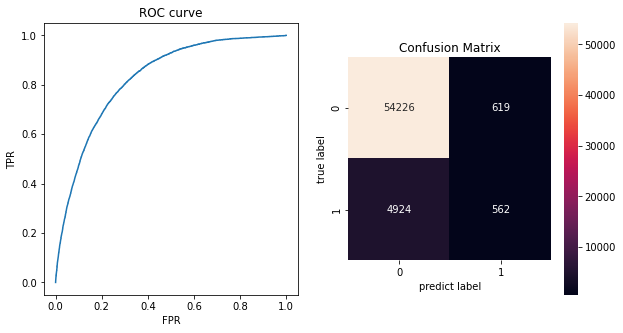

In [35]:
from lightgbm import LGBMClassifier
lgb = LGBMClassifier(n_estimators=1000,num_leaves=64,n_jobs=-1,boost_from_average=False)
modeling(lgb,x_train,x_test,y_train,y_test)

Accuracy:  0.7809 

Precision:  0.2458 

Recall:  0.6816 

F1_score:  0.3613 

Roc_score:  0.7362 

Confusion Matrix: 
 [[43371 11474]
 [ 1747  3739]]


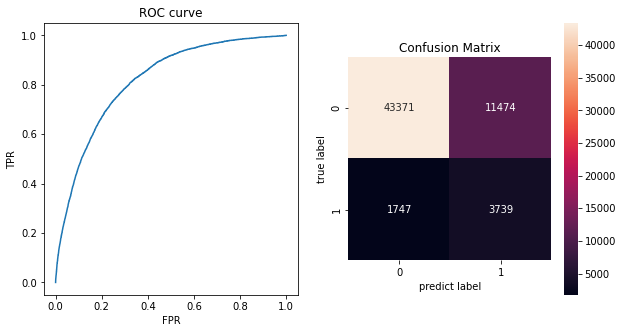

In [36]:
#costsensetive
lgb_cost = LGBMClassifier(n_estimators=1000,num_leaves=64,n_jobs=-1,boost_from_average=False, class_weight='balanced')
modeling(lgb_cost,x_train,x_test,y_train,y_test)


In [ ]:
##오버샘플링 처리
from imblearn.over_sampling import *

#SMOTE
x_train_SMOTE, y_train_SMOTE =SMOTE(random_state=42).fit_resample(x_train, y_train)

#BorderlineSMOTE
x_train_BorderlineSM, y_train_BorderlineSM =BorderlineSMOTE(random_state=42).fit_resample(x_train, y_train)

#SVMSMOTE
x_train_SVMSMOTE, y_train_SVMSMOTE =SVMSMOTE(random_state=42).fit_resample(x_train, y_train) 

#ADASYN
x_train_ADASYN, y_train_ADASYN =ADASYN(random_state=42).fit_resample(x_train, y_train)

In [ ]:
print('SMOTE 결과')
model_SMOTE=modeling(lgb,x_train_SMOTE,x_test, y_train_SMOTE,y_test)
model_SMOTE
print('\n\n')
print('BorderlineSMOTE 결과')
model_Borderline=modeling(lgb,x_train_BorderlineSM,x_test, y_train_BorderlineSM,y_test)
model_Borderline
print('\n\n')
print('SVMSMOTE 결과')
model_SVM=modeling(lgb,x_train_SVMSMOTE,x_test, y_train_SVMSMOTE,y_test)
model_SVM
print('\n\n')
print('ADASYN 결과')
model_ADASYN=modeling(lgb,x_train_ADASYN,x_test, y_train_ADASYN,y_test)
model_ADASYN
print('\n\n')

SMOTE 결과
Accuracy:  0.8641 

Precision:  0.2827 

Recall:  0.3215 

F1_score:  0.3009 

Roc_score:  0.6200 

Confusion Matrix: 
 [[50370  4475]
 [ 3722  1764]]



BorderlineSMOTE 결과
Accuracy:  0.8636 

Precision:  0.2844 

Recall:  0.3299 

F1_score:  0.3055 

Roc_score:  0.6234 

Confusion Matrix: 
 [[50290  4555]
 [ 3676  1810]]



SVMSMOTE 결과
Accuracy:  0.8805 

Precision:  0.3322 

Recall:  0.3108 

F1_score:  0.3211 

Roc_score:  0.6241 

Confusion Matrix: 
 [[51417  3428]
 [ 3781  1705]]



ADASYN 결과
Accuracy:  0.8607 

Precision:  0.2738 

Recall:  0.3223 

F1_score:  0.2961 

Roc_score:  0.6184 

Confusion Matrix: 
 [[50156  4689]
 [ 3718  1768]]





In [ ]:
#오버 샘플링 결과

print('befor oversampling :\n', y_train.value_counts())
print('\nAfter SMOTE :\n', y_train_SMOTE.value_counts())
print('\n\n')
print('befor oversampling :\n', y_train.value_counts())
print('\nAfter BoderlineSMOTE :\n', y_train_BorderlineSM.value_counts())
print('\n\n')
print('befor oversampling :\n', y_train.value_counts())
print('\nAfter SVMSMOTE :\n', y_train_SVMSMOTE.value_counts())
print('\n\n')
print('befor oversampling :\n', y_train.value_counts())
print('\nAfter ADASYN :\n', y_train_ADASYN.value_counts())
print('\n\n')

befor oversampling :
 0    219556
1     21766
Name: HeartDisease, dtype: int64

After SMOTE :
 1    219556
0    219556
Name: HeartDisease, dtype: int64



befor oversampling :
 0    219556
1     21766
Name: HeartDisease, dtype: int64

After BoderlineSMOTE :
 1    219556
0    219556
Name: HeartDisease, dtype: int64



befor oversampling :
 0    219556
1     21766
Name: HeartDisease, dtype: int64

After SVMSMOTE :
 1    219556
0    219556
Name: HeartDisease, dtype: int64



befor oversampling :
 0    219556
1     21766
Name: HeartDisease, dtype: int64

After ADASYN :
 1    219556
0    219556
Name: HeartDisease, dtype: int64





In [ ]:
# 복합 샘플링 진행 
from imblearn.combine import *

#SMOTEENN
x_train_SMOTEENN, y_train_SMOTEENN =SMOTEENN(random_state=42).fit_resample(x_train, y_train)

In [ ]:
print('SMOTEENN 결과\n')
model_SMOTEENN=modeling(lgb,x_train_SMOTEENN,x_test, y_train_SMOTEENN,y_test)
model_SMOTEENN

SMOTEENN 결과

Accuracy:  0.8409 

Precision:  0.2917 

Recall:  0.5246 

F1_score:  0.3749 

Roc_score:  0.6986 

Confusion Matrix: 
 [[47856  6989]
 [ 2608  2878]]


In [ ]:
#복합 샘플링 결과
print('befor combinesampling :\n', y_train.value_counts())
print('\nAfter SMOTEENN :\n', y_train_SMOTEENN.value_counts())

befor combinesampling :
 0    219556
1     21766
Name: HeartDisease, dtype: int64

After SMOTEENN :
 1    169878
0    163892
Name: HeartDisease, dtype: int64


In [ ]:
# 하이퍼파라미터
lgb_hyper = LGBMClassifier(n_estimators=1000,num_leaves=64,num_iterations=1000,learning_rate=0.05,min_child_samples=30,max_depth=15, boosting='dart')
modeling(lgb_hyper,x_train,x_test,y_train,y_test)

Accuracy:  0.9108 

Precision:  0.5687 

Recall:  0.0800 

F1_score:  0.1403 

Roc_score:  0.5370 

Confusion Matrix: 
 [[54512   333]
 [ 5047   439]]


In [ ]:
print('SMOTE 결과')
modeling(lgb_hyper,x_train_SMOTE,x_test, y_train_SMOTE,y_test)
print('\n\n')
print('BorderlineSMOTE 결과')
modeling(lgb_hyper,x_train_BorderlineSM,x_test, y_train_BorderlineSM,y_test)
print('\n\n')
print('SVMSMOTE 결과')
modeling(lgb_hyper,x_train_SVMSMOTE,x_test, y_train_SVMSMOTE,y_test)
print('\n\n')
print('ADASYN 결과')
modeling(lgb_hyper,x_train_ADASYN,x_test, y_train_ADASYN,y_test)
print('\n\n')
print('SMOTETENN 결과')
modeling(lgb_hyper,x_train_SMOTEENN,x_test, y_train_SMOTEENN,y_test)

SMOTE 결과
Accuracy:  0.8559 

Precision:  0.2868 

Recall:  0.3932 

F1_score:  0.3317 

Roc_score:  0.6477 

Confusion Matrix: 
 [[49482  5363]
 [ 3329  2157]]



BorderlineSMOTE 결과
Accuracy:  0.8547 

Precision:  0.2875 

Recall:  0.4045 

F1_score:  0.3361 

Roc_score:  0.6521 

Confusion Matrix: 
 [[49345  5500]
 [ 3267  2219]]



SVMSMOTE 결과
Accuracy:  0.8737 

Precision:  0.3312 

Recall:  0.3819 

F1_score:  0.3547 

Roc_score:  0.6524 

Confusion Matrix: 
 [[50614  4231]
 [ 3391  2095]]



ADASYN 결과
Accuracy:  0.8516 

Precision:  0.2732 

Recall:  0.3806 

F1_score:  0.3181 

Roc_score:  0.6397 

Confusion Matrix: 
 [[49291  5554]
 [ 3398  2088]]



SMOTETENN 결과
Accuracy:  0.8299 

Precision:  0.2849 

Recall:  0.5766 

F1_score:  0.3813 

Roc_score:  0.7159 

Confusion Matrix: 
 [[46904  7941]
 [ 2323  3163]]


In [ ]:
#costsensetive
lgb_hyper_cost = LGBMClassifier(n_estimators=1000,num_leaves=64,n_jobs=-1,boost_from_average=False, class_weight='balanced')
modeling(lgb_hyper_cost,x_train,x_test,y_train,y_test)

Accuracy:  0.7809 

Precision:  0.2458 

Recall:  0.6816 

F1_score:  0.3613 

Roc_score:  0.7362 

Confusion Matrix: 
 [[43371 11474]
 [ 1747  3739]]


In [ ]:
!pip install pdpbox
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 34.0 MB 220 kB/s 
     |████████████████████████████████| 13.1 MB 26.8 MB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758224 sha256=059931b5f0090d5c119632ca4a276c1365a57d32aef146b772dc990e2bf8ec1f
  Stored in directory: /root/.cache/pip/wheels/f4/d0/1a/b80035625c53131f52906a6fc4dd690d8efd2bf8af6a4015eb
Successfully built pdpbox
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 564 kB 4.2 MB/s 


In [ ]:
from pdpbox import pdp
import shap
print(x_test.columns)
#분포를 보기위해 yes no와 그 외로 피쳐 분리
feature = ['Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Sex',  'PhysicalActivity',   'Asthma', 'KidneyDisease',
       'SkinCancer', 'Diabetic']
feature2=['BMI', 'PhysicalHealth', 'MentalHealth', 'AgeCategory',  'GenHealth', 'SleepTime', 'Race_encoder']
features = x_test.columns

Index(['BMI', 'Smoking', 'AlcoholDrinking', 'Stroke', 'PhysicalHealth',
       'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory', 'Diabetic',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       'SkinCancer', 'Race_encoder'],
      dtype='object')


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


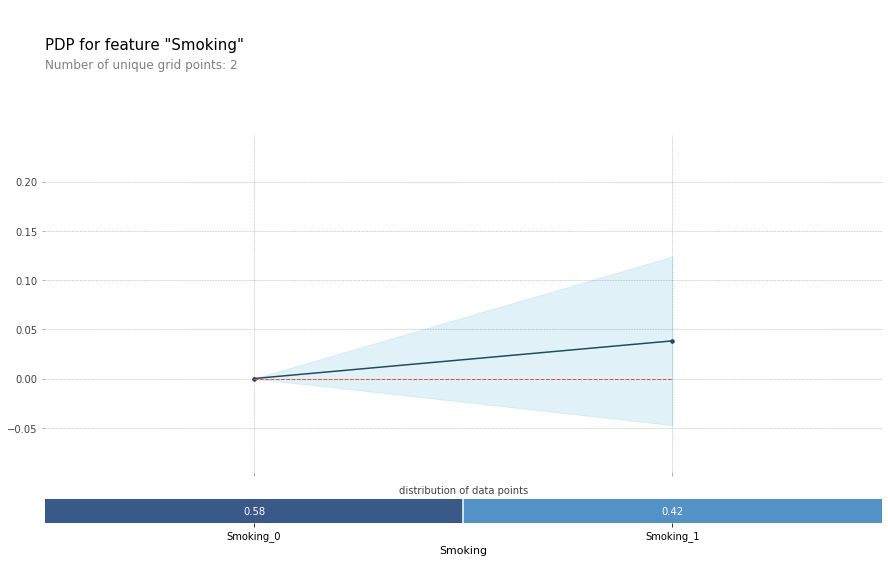

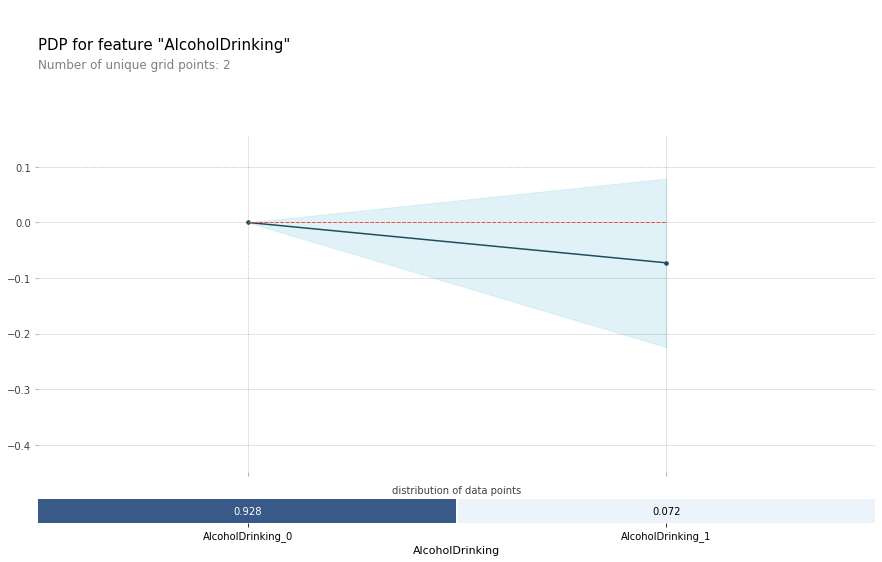

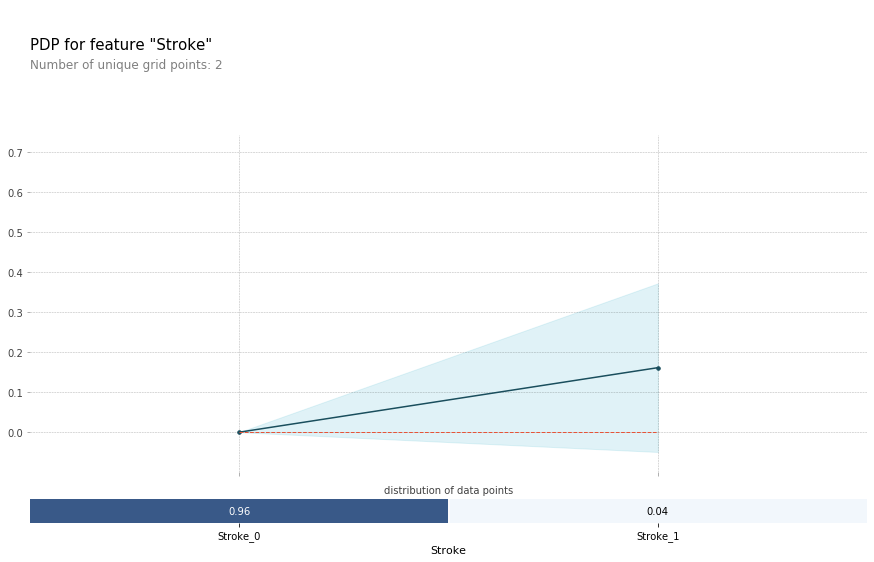

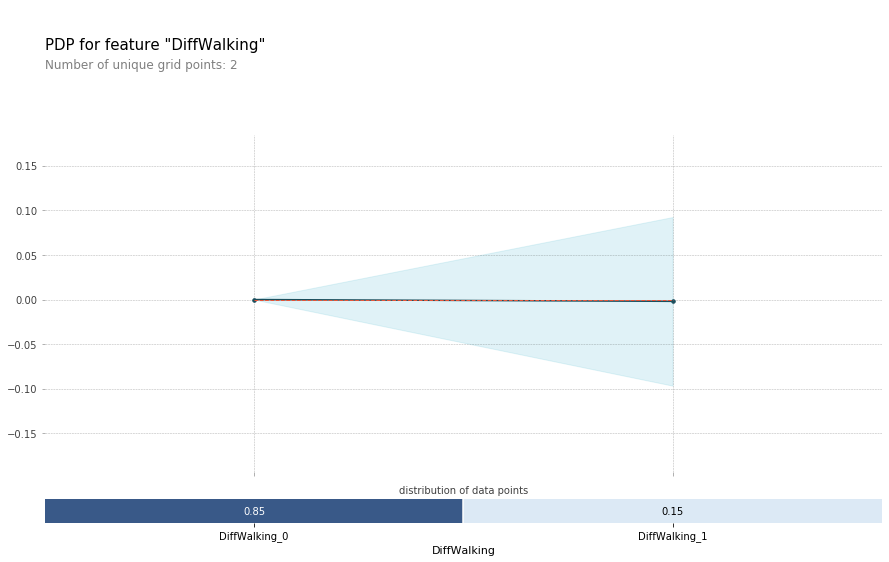

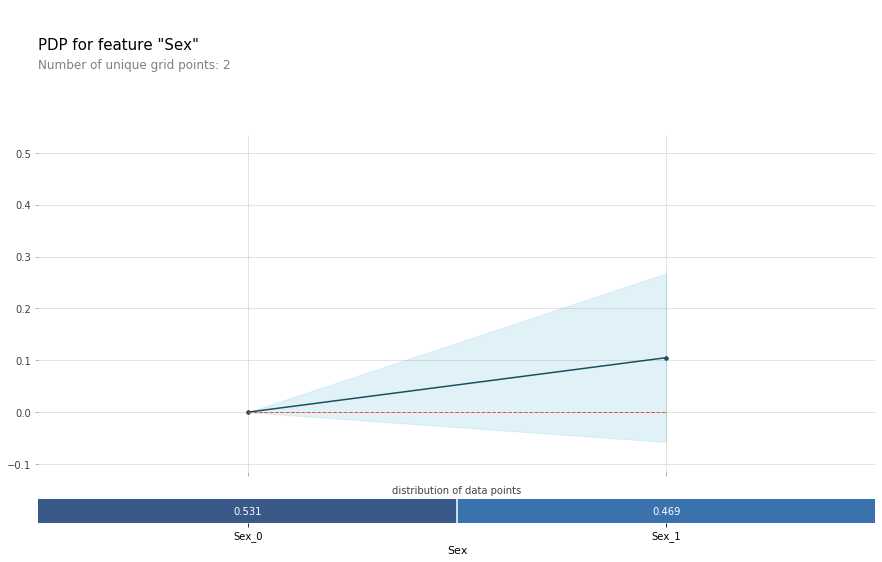

...

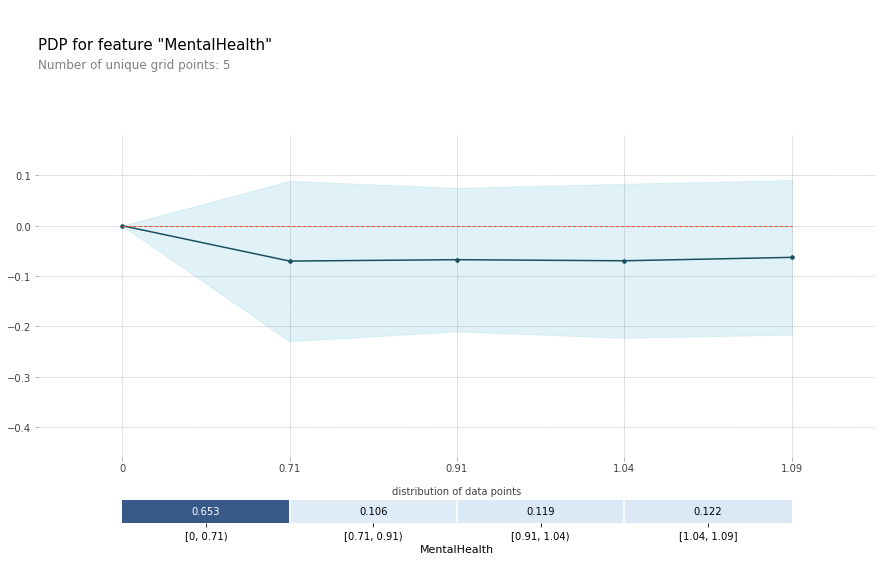

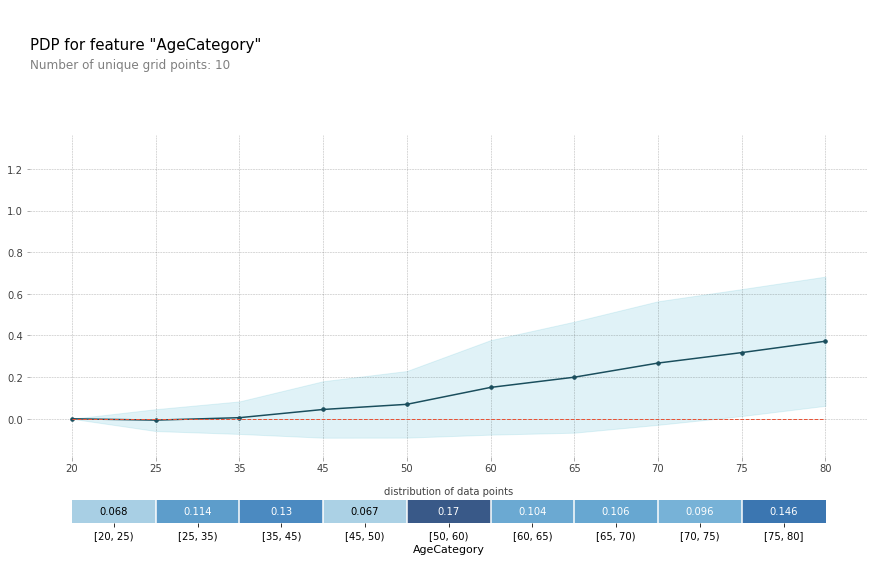

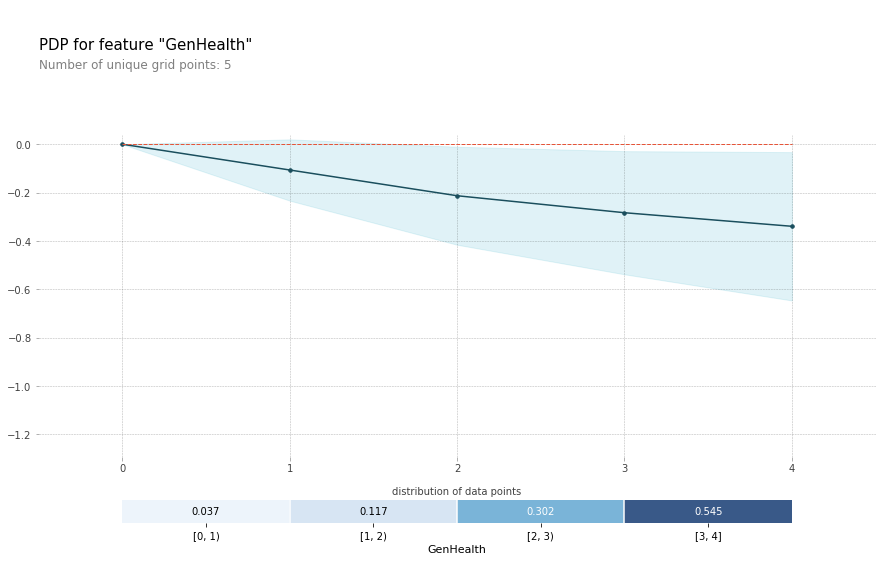

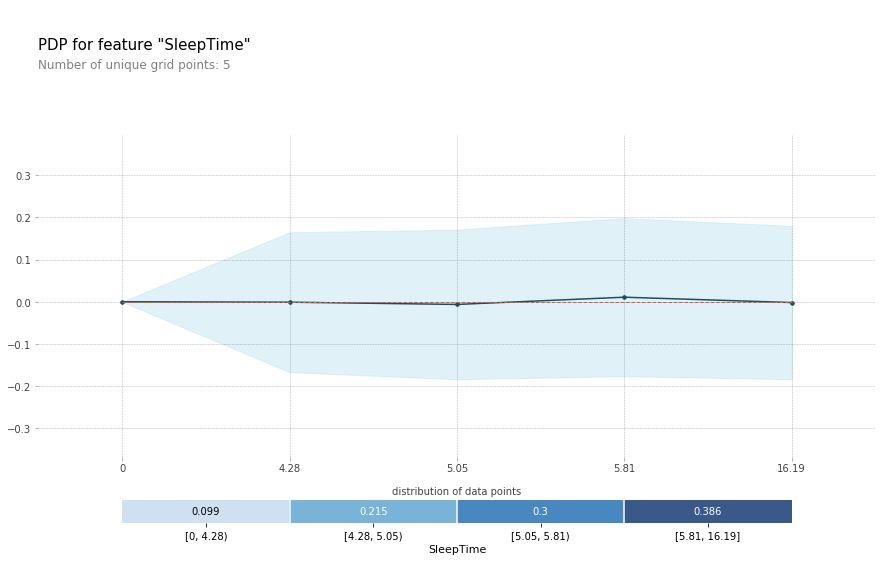

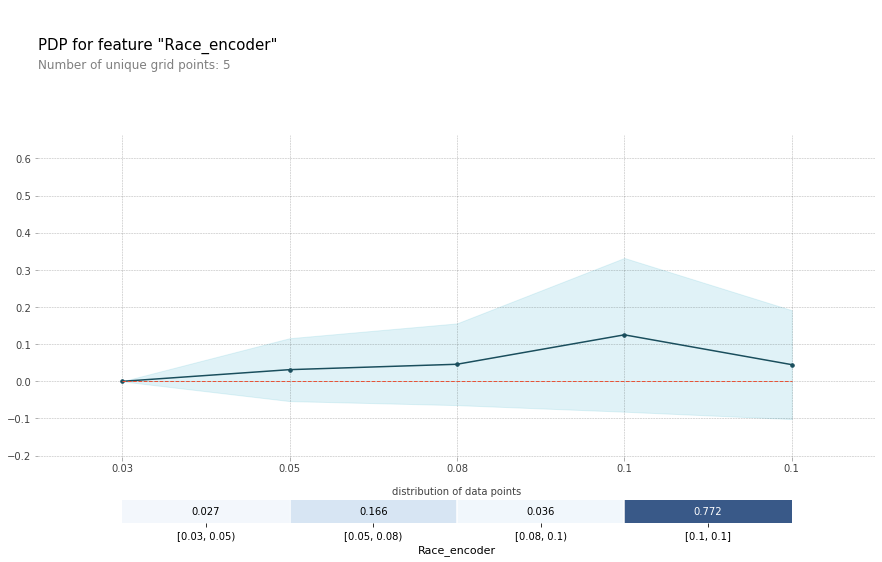

In [ ]:
# 샘플링 없는 pdp
for i in range (len(feature)):
  pdp_res = pdp.pdp_isolate(model=lgb, dataset=x_test, model_features=features, feature=feature[i])
  pdp.pdp_plot(pdp_res, feature[i], plot_pts_dist=True)
for i in range (len(feature2)):
  pdp_res = pdp.pdp_isolate(model=lgb, dataset=x_test, model_features=features, feature=feature2[i])
  pdp.pdp_plot(pdp_res, feature2[i], plot_pts_dist=True,  x_quantile=True)

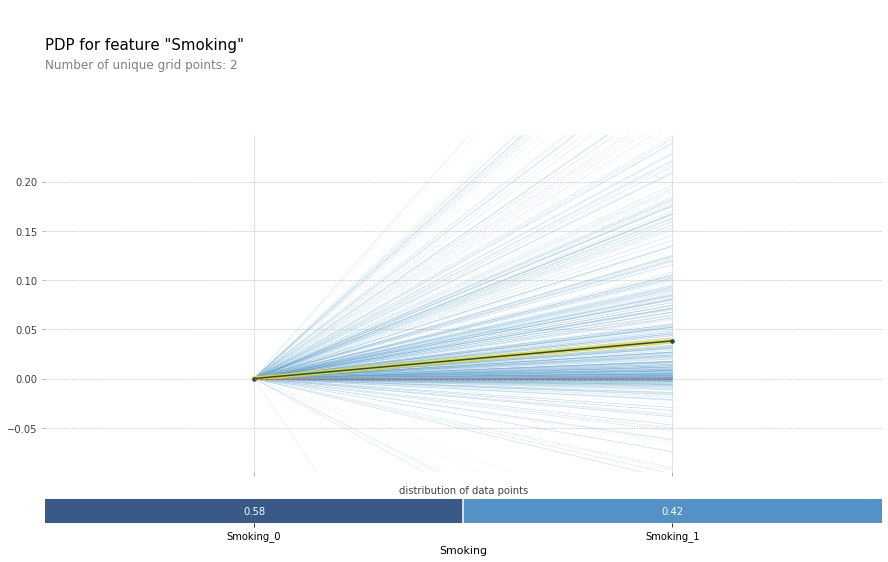

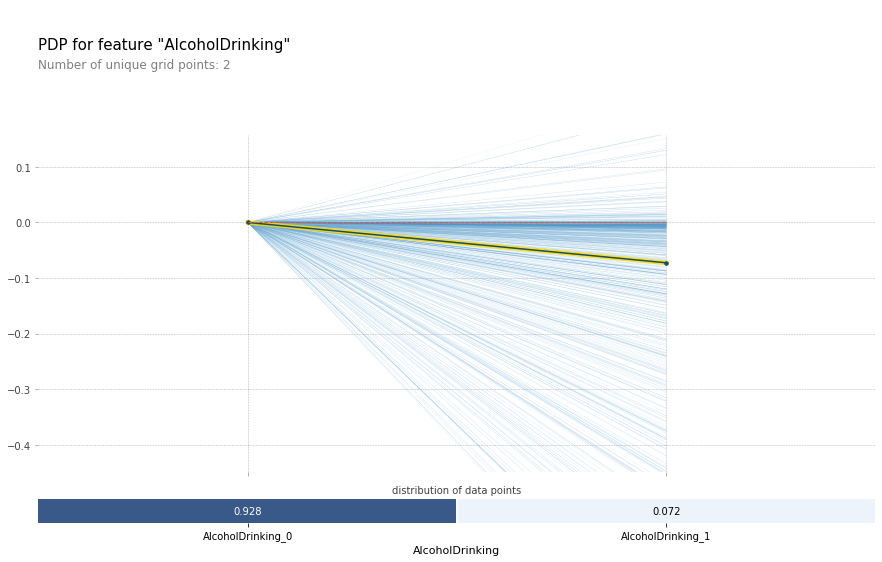

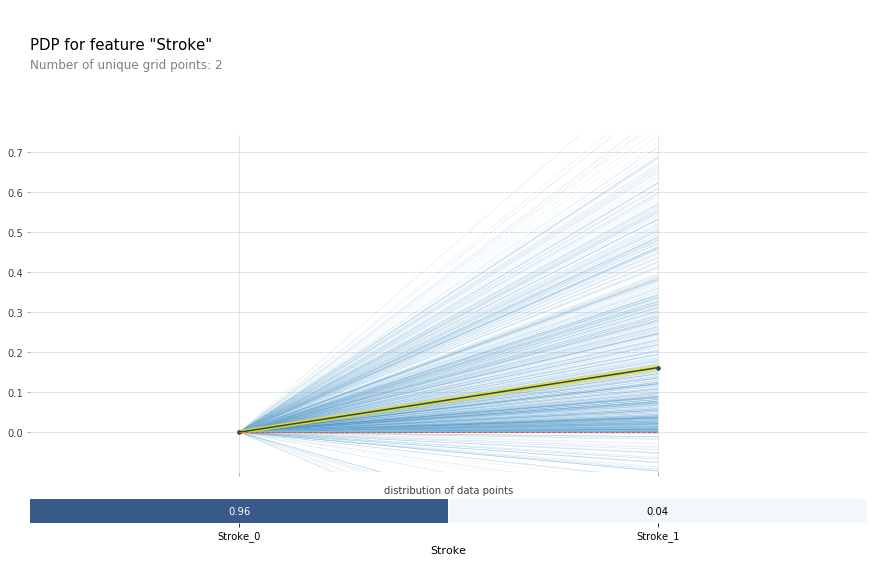

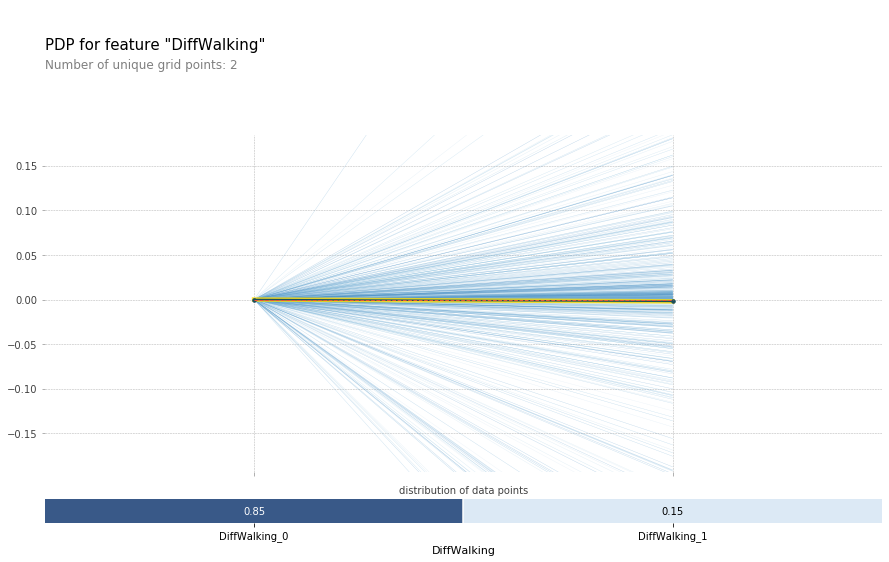

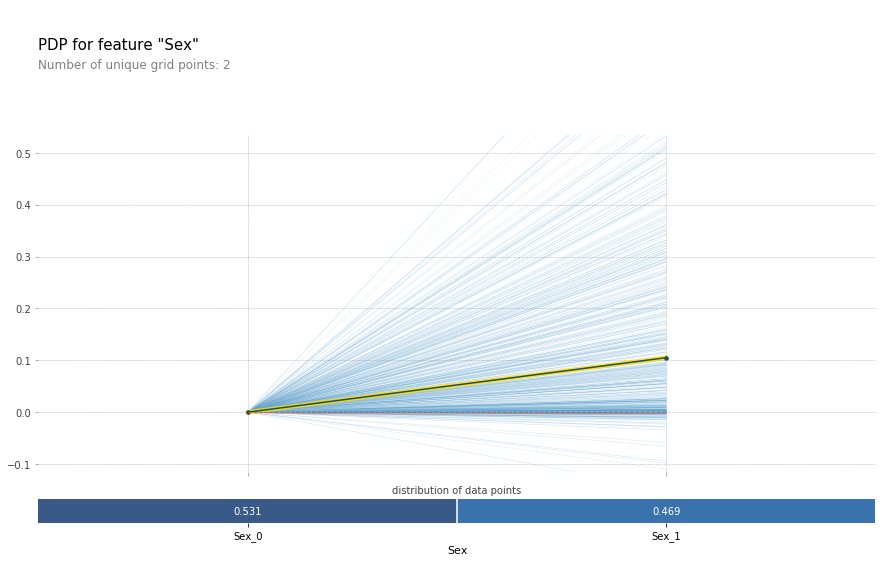

...

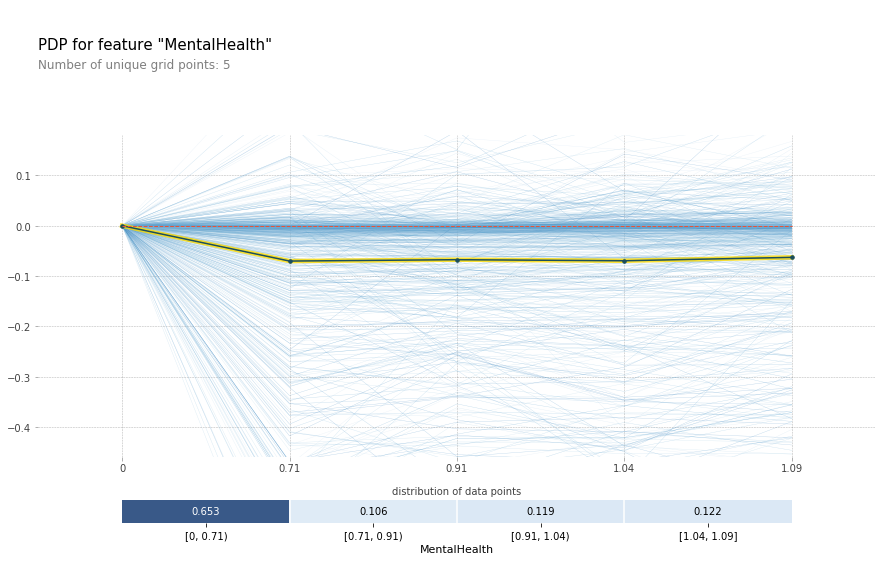

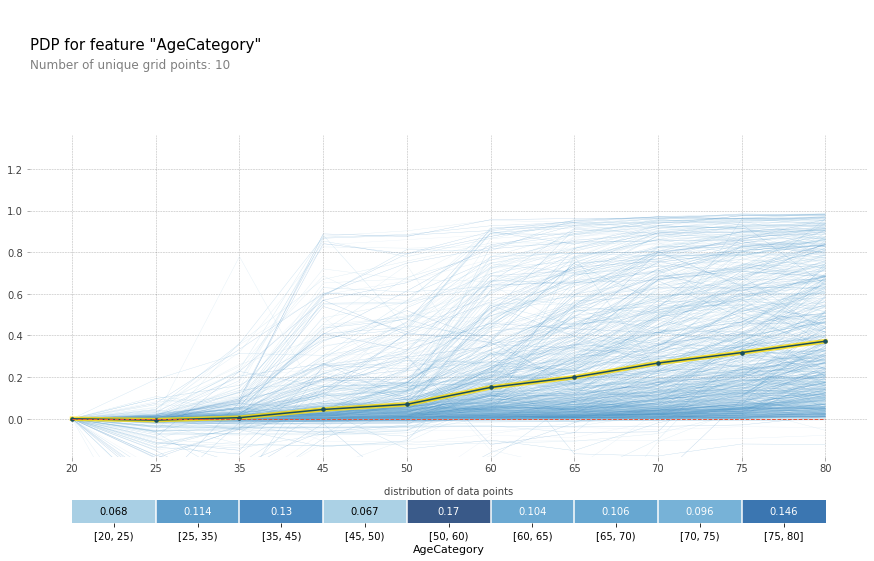

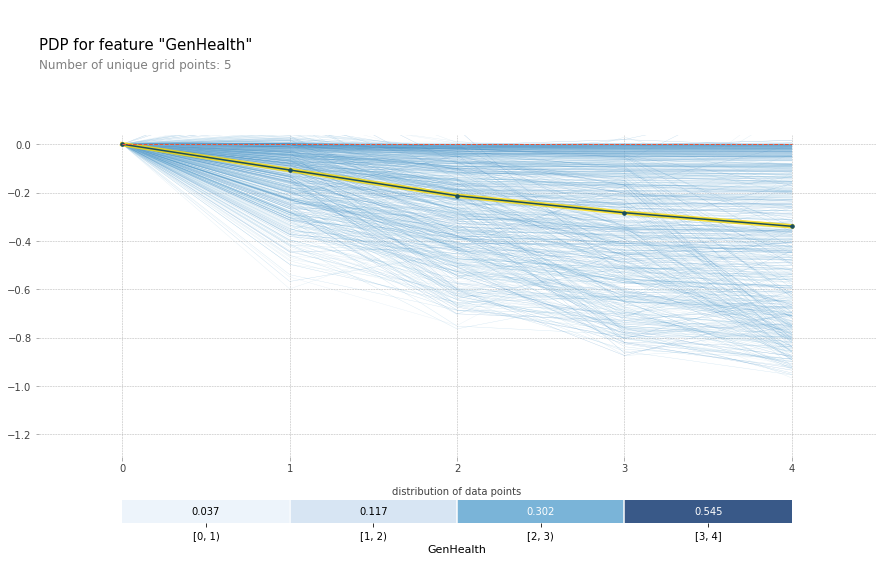

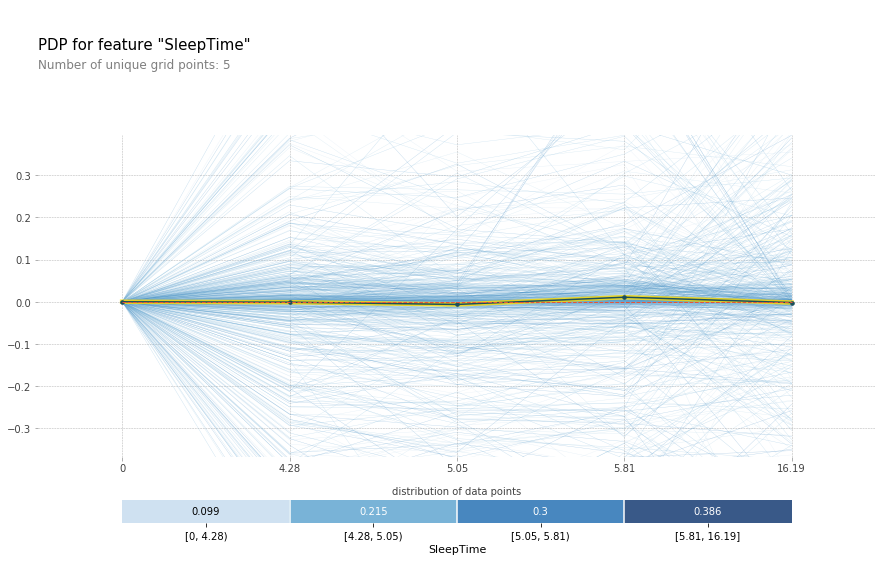

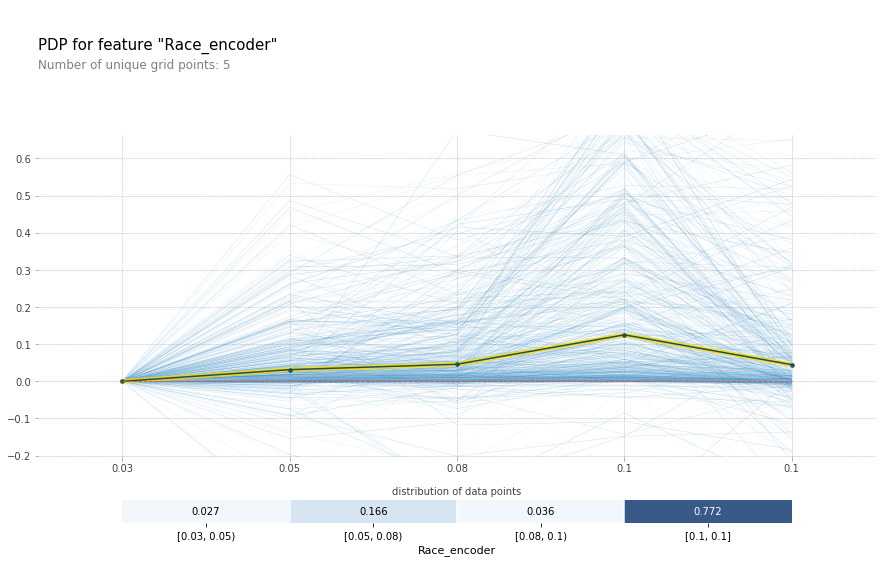

In [ ]:
# 샘플링 적용안한 경우의 center ICE
for i in range (len(feature)):
  pdp_res = pdp.pdp_isolate(model=lgb, dataset=x_test, model_features=features, feature=feature[i])
  pdp.pdp_plot(pdp_res, feature[i],frac_to_plot=800, plot_lines=True, plot_pts_dist=True)
for i in range (len(feature2)):
  pdp_res = pdp.pdp_isolate(model=lgb, dataset=x_test, model_features=features, feature=feature2[i])
  pdp.pdp_plot(pdp_res, feature2[i], frac_to_plot=800, plot_lines=True, plot_pts_dist=True,  x_quantile=True)

In [ ]:
# SHAP
model_lgb= lgb.fit(x_train,y_train)

explainer = shap.TreeExplainer(model_lgb)
shap_values = explainer.shap_values(x_test)

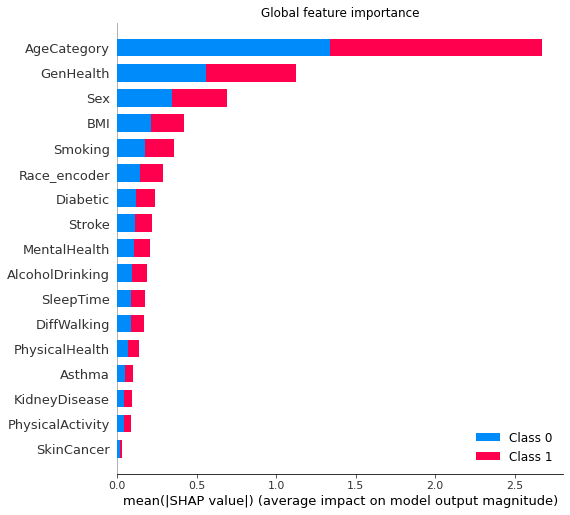

In [ ]:
plt.title('Global feature importance')
shap.summary_plot(shap_values,feature_names=features)


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


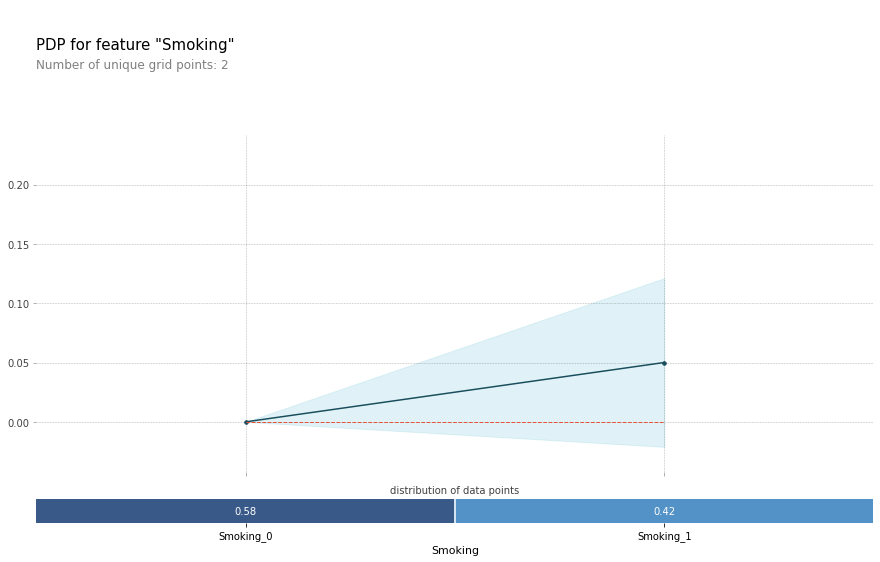

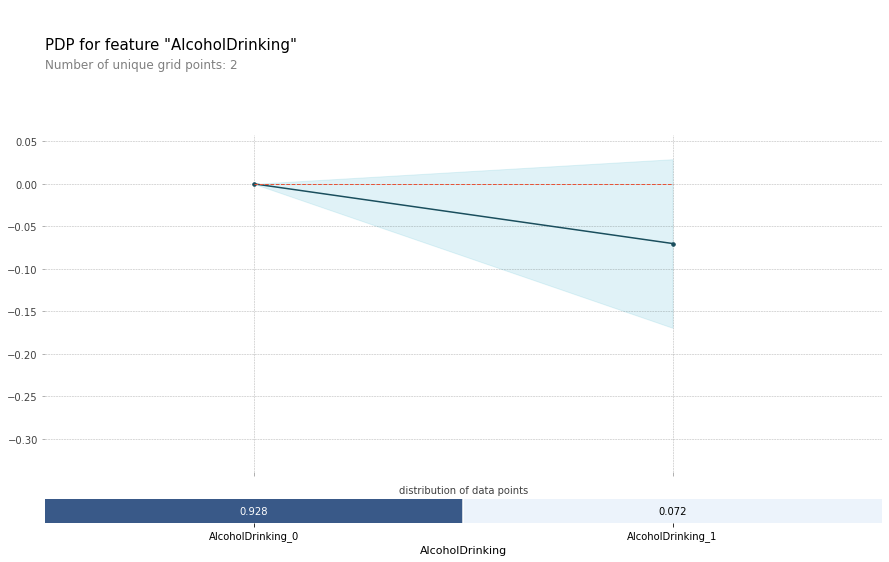

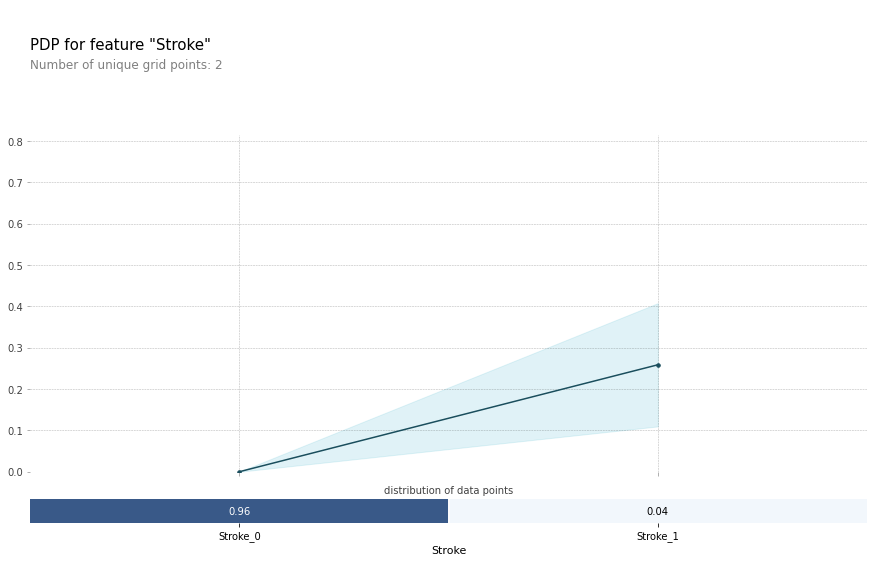

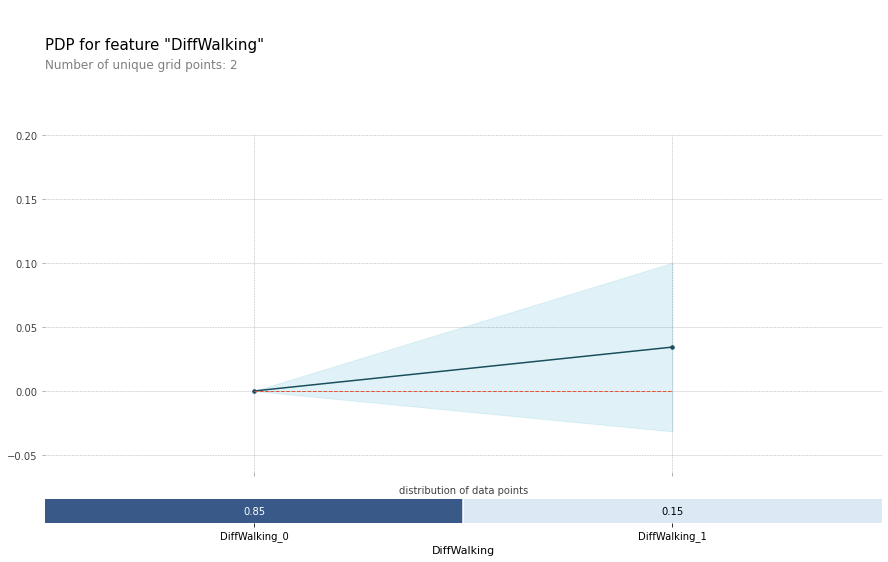

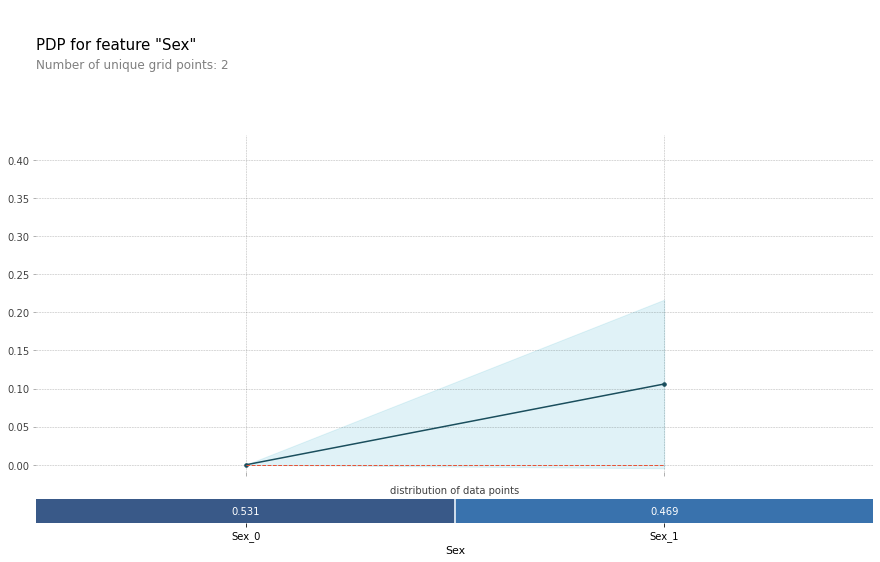

...

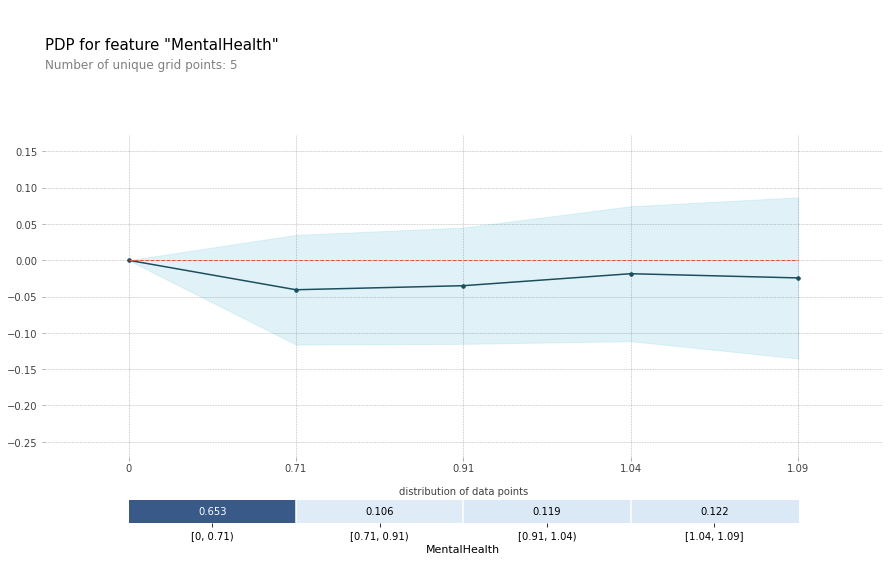

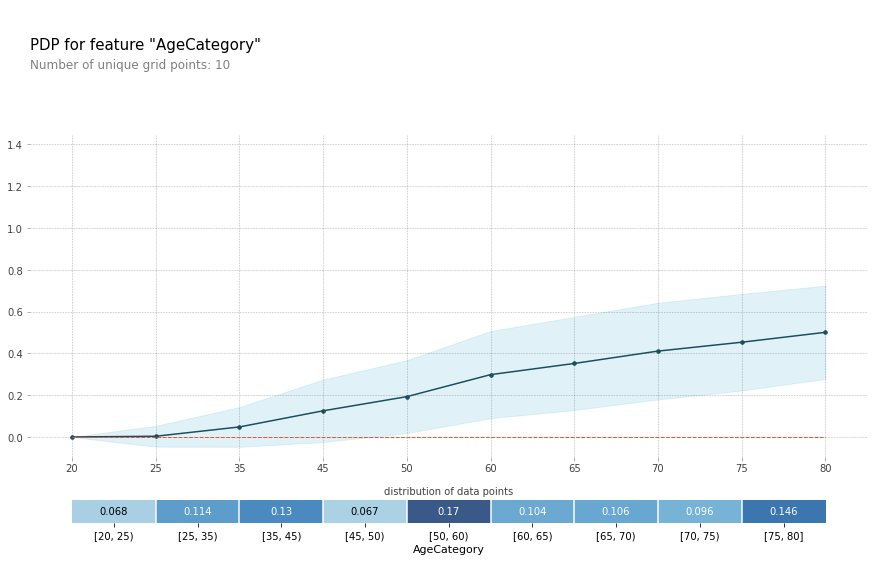

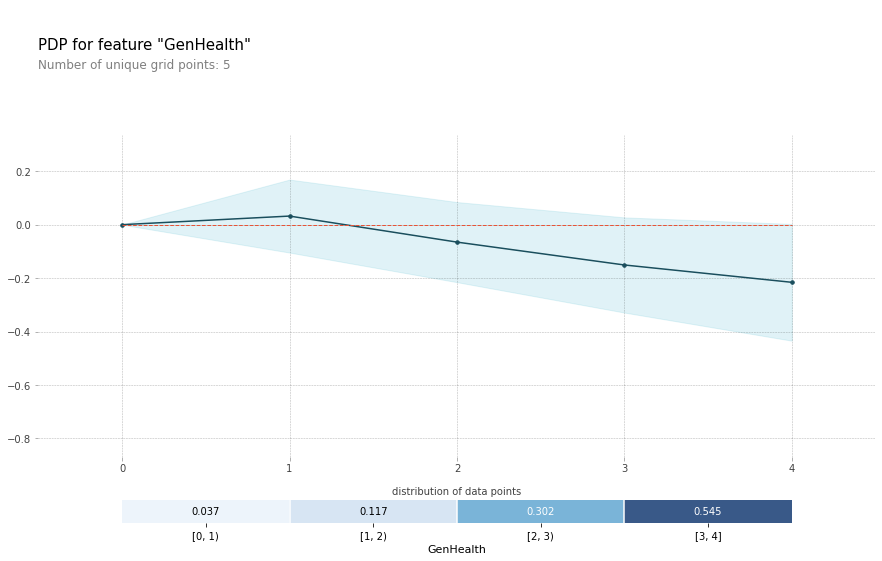

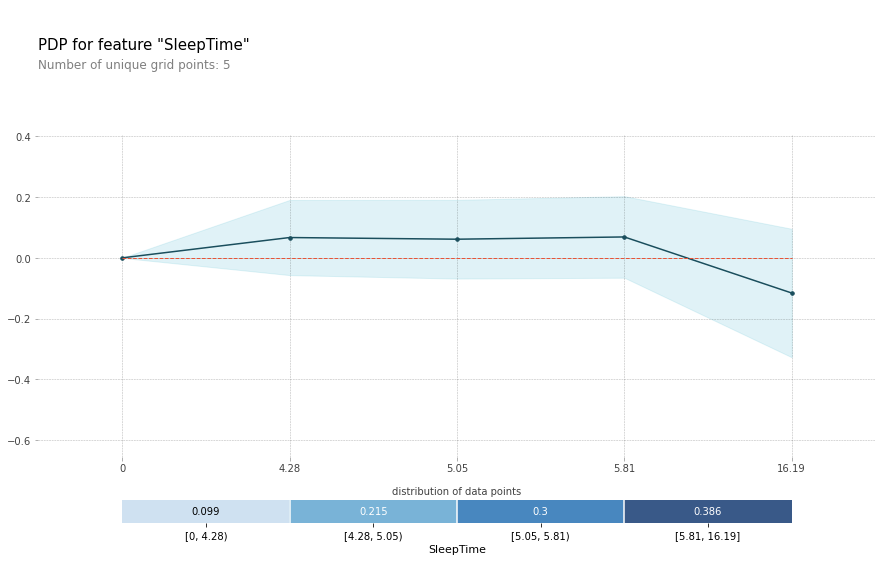

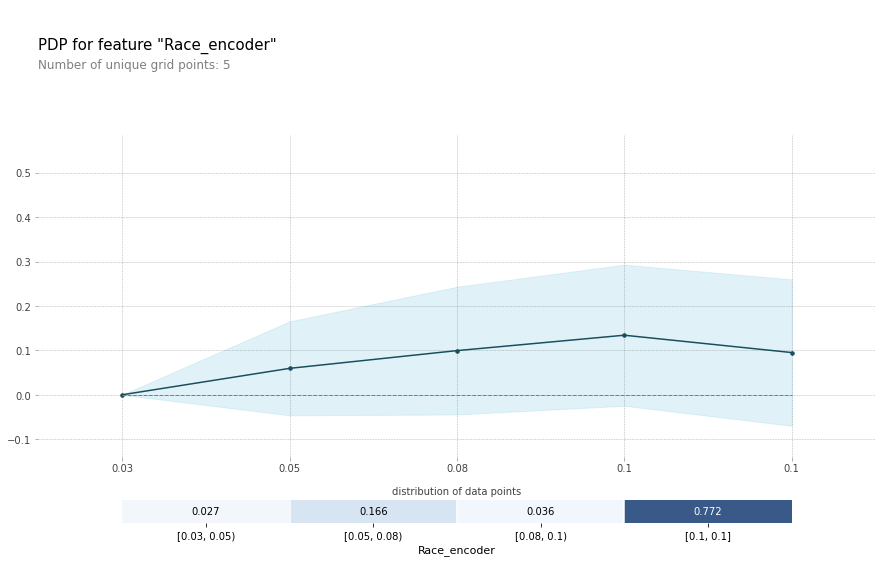

In [ ]:
# costsensetive pdp
for i in range (len(feature)):
  pdp_res = pdp.pdp_isolate(model=lgb_cost, dataset=x_test, model_features=features, feature=feature[i])
  pdp.pdp_plot(pdp_res, feature[i], plot_pts_dist=True)
for i in range (len(feature2)):
  pdp_res = pdp.pdp_isolate(model=lgb_cost, dataset=x_test, model_features=features, feature=feature2[i])
  pdp.pdp_plot(pdp_res, feature2[i], plot_pts_dist=True,  x_quantile=True)

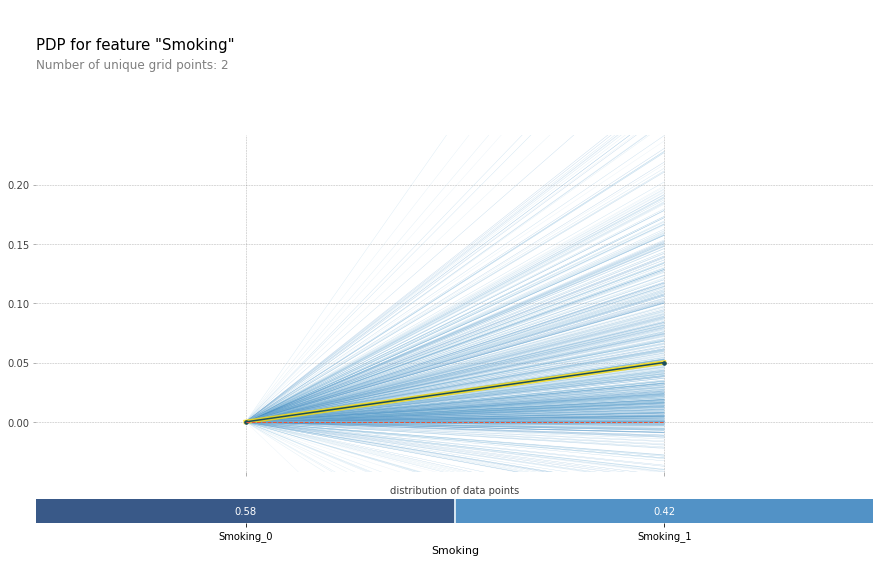

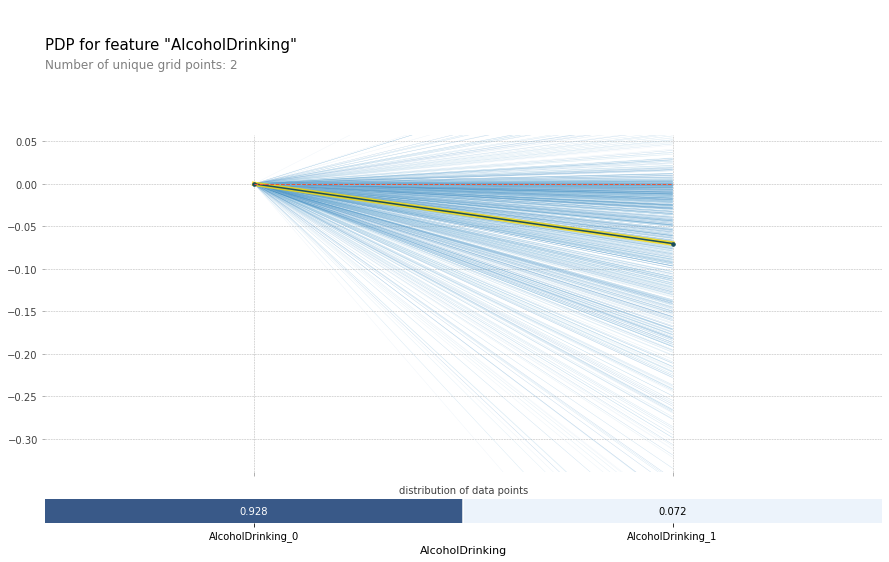

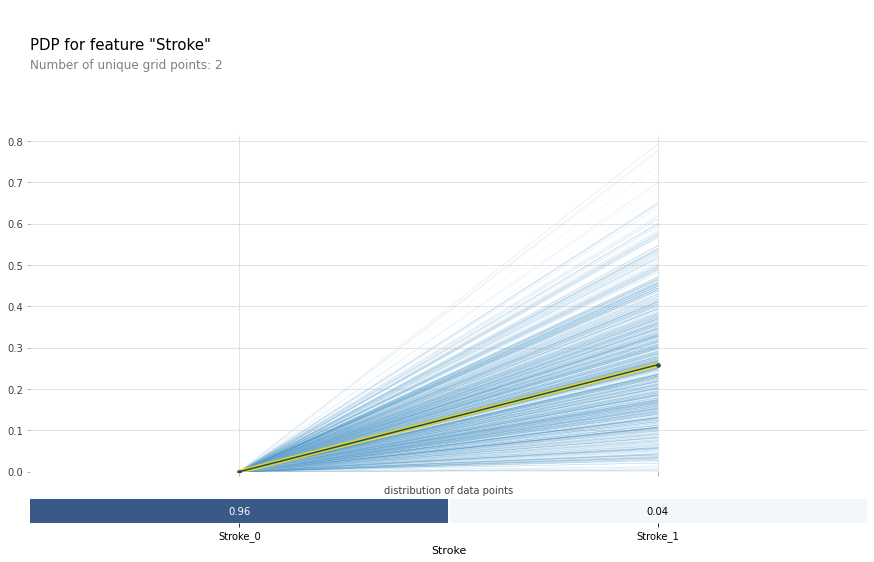

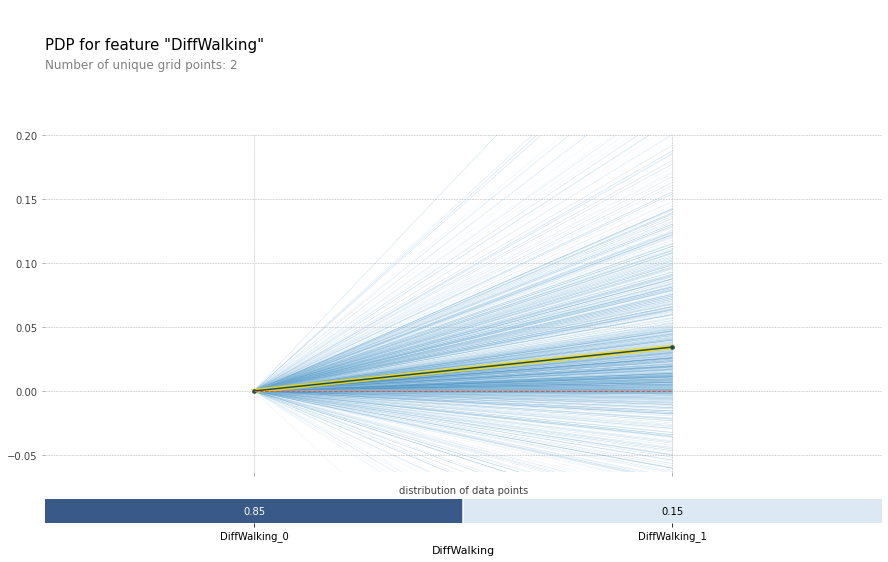

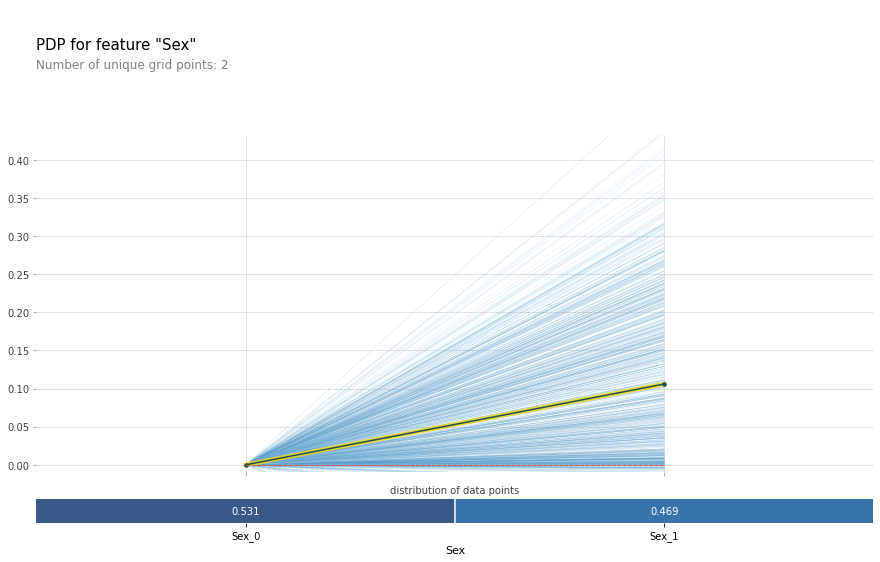

...

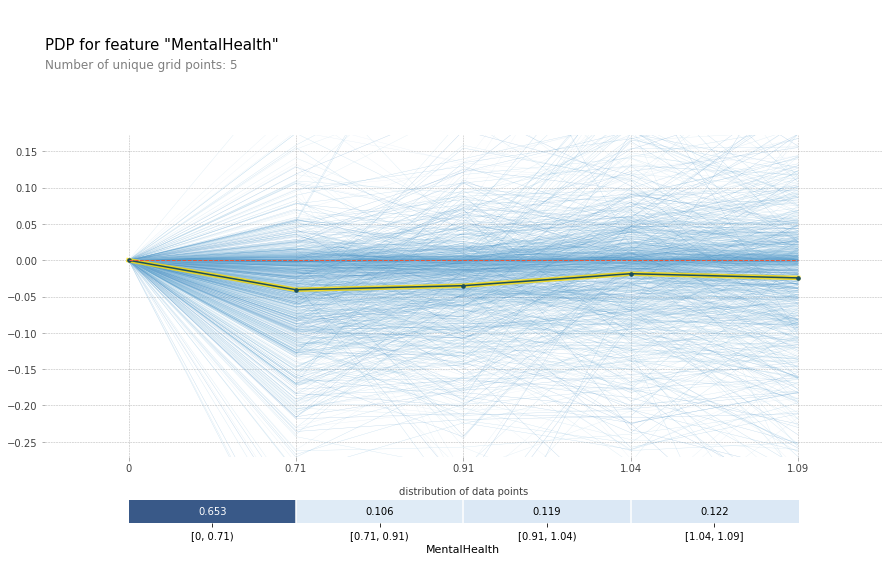

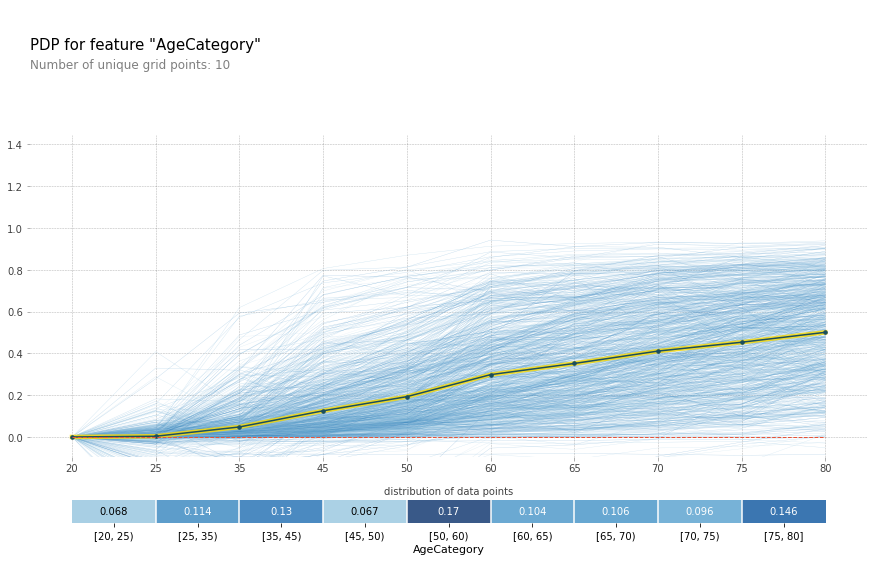

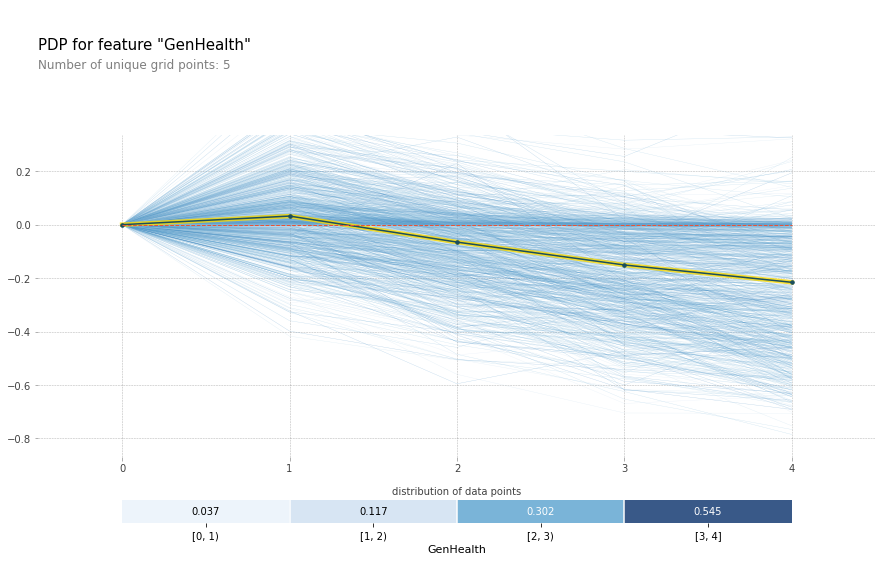

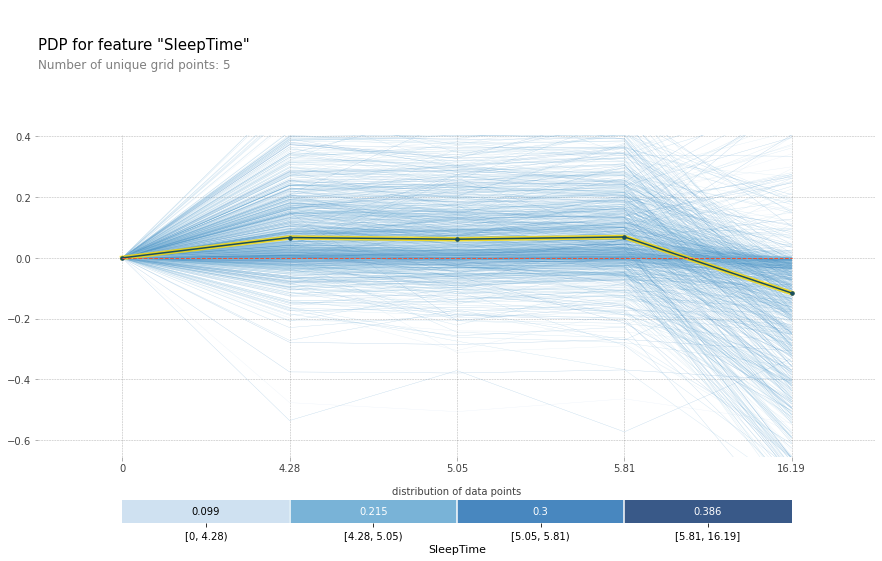

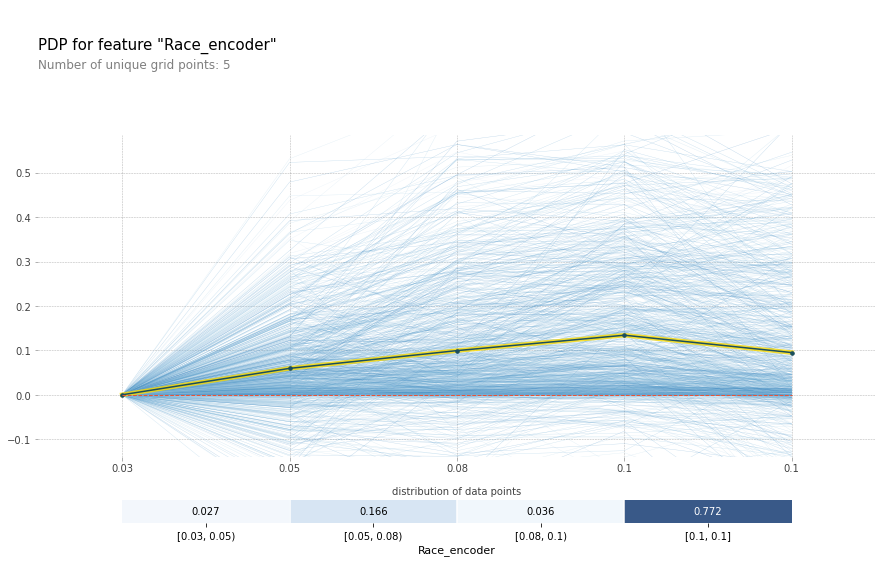

In [ ]:
# costsensetive center ICE
for i in range (len(feature)):
  pdp_res = pdp.pdp_isolate(model=lgb_cost, dataset=x_test, model_features=features, feature=feature[i])
  pdp.pdp_plot(pdp_res, feature[i],frac_to_plot=1000, plot_lines=True, plot_pts_dist=True)
for i in range (len(feature2)):
  pdp_res = pdp.pdp_isolate(model=lgb_cost, dataset=x_test, model_features=features, feature=feature2[i])
  pdp.pdp_plot(pdp_res, feature2[i], frac_to_plot=1000, plot_lines=True, plot_pts_dist=True,  x_quantile=True)

In [ ]:
# SHAP
model_lgb_cost= lgb_cost.fit(x_train,y_train)

explainer_cost = shap.TreeExplainer(model_lgb_cost)
shap_values_cost = explainer_cost.shap_values(x_test)

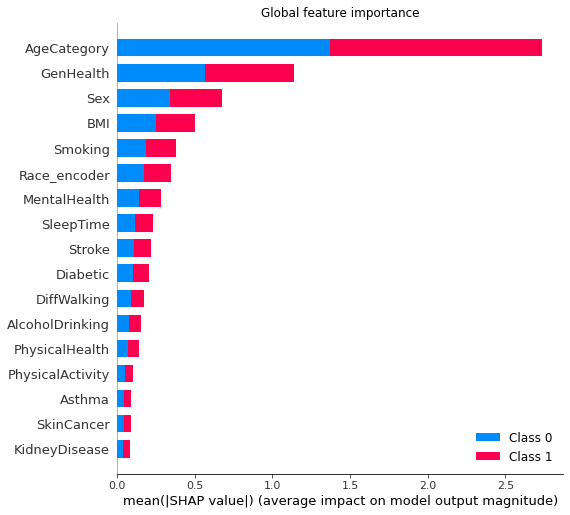

In [ ]:
plt.title('Global feature importance')
shap.summary_plot(shap_values_cost, plot_type="bar",feature_names=features)